# Problem Tanımı

Problem Tanımı: Omurga Disk Kayması Tespiti

Omurga disk kayması, omurgadaki disklerin yer değiştirmesi sonucu omurilik veya sinirlere baskı yaparak ağrı ve fonksiyon kaybına yol açan bir durumdur. Günümüzde, manyetik rezonans görüntüleme (MRI) gibi ileri görüntüleme teknikleri kullanılarak disk kayması tespiti yapılmaktadır. Ancak, bu tür görüntülerin incelenmesi oldukça zaman alıcıdır ve hata payı insan faktörüne bağlı olarak değişebilmektedir. Bu projede, MRI görüntüleri üzerinde otomatik segmentasyon teknikleri kullanılarak omurga disk kayması ve hasar tespiti yapmayı hedefliyoruz.

Bu projenin amacı, disk kaymasının hızlı ve doğru bir şekilde tespitini sağlayacak bir otomasyon sistemi geliştirmektir. Bu sistem, omurga bölgesindeki kaymış diskleri segmentasyon yoluyla işaretleyecek ve ardından potansiyel hastalıklı alanları tanımlayacaktır.




.

# DeepLabV3 Modeli ve Eğitim

 DeepLabV3+ modelini kullanarak omurga segmentasyonu yapmak için gerekli olan adımları içeriyor. Özellikle, daha hafif ve daha verimli bir model olan deeplabv3_mobilenet_v3_large modelini kullanarak veri kümesi üzerinden eğitim yapılmasını sağlıyor. Ayrıca, FP16 formatında model kaydedilerek belleği daha verimli kullanmak amaçlanıyor.

 # Adımların Özeti:

Model Yükleme:

deeplabv3_mobilenet_v3_large modeli, önceden eğitilmiş ağırlıkları ile yükleniyor ve son katman (classifier) tek kanal çıkışı verecek şekilde değiştirilmiş.

Veri Seti:

SpineDataset sınıfı, görüntü ve etiketler için veri kümesini okur ve uygun dönüşümleri uygular.

Dönüşümler:

Görüntüler ve etiketler, torchvision.transforms kullanılarak tensor formatına dönüştürülüyor. Ayrıca, veri yükleyici (DataLoader) kullanılarak dinamik padding uygulaması yapılıyor.

Eğitim Döngüsü:

Model, BCEWithLogitsLoss kayıp fonksiyonu ve Adam optimizasyon algoritması ile eğitiliyor. Eğitim sırasında her epoch sonunda kayıp değeri yazdırılıyor.

Modeli FP16 Formatında Kaydetme:

Eğitim tamamlandığında model, FP16 (yarım hassasiyet) formatında kaydediliyor.

In [5]:
import os
import torch
import torch.nn as nn
from torchvision.models.segmentation import deeplabv3_mobilenet_v3_large  # Daha hafif model
from torchvision.transforms import functional as TF
from torch.utils.data import Dataset, DataLoader
from PIL import Image

# Cihaz kontrolü
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Daha hafif DeepLabV3+ Modelini yükle
model = deeplabv3_mobilenet_v3_large(pretrained=True)
model.classifier[4] = nn.Conv2d(256, 1, kernel_size=(1, 1), stride=(1, 1))
model = model.to(device)

# Veri seti sınıfı
class SpineDataset(Dataset):
    def __init__(self, image_dir, label_dir, transform=None):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.image_files = sorted(os.listdir(image_dir))
        self.label_files = sorted(os.listdir(label_dir))
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        image_path = os.path.join(self.image_dir, self.image_files[idx])
        label_path = os.path.join(self.label_dir, self.label_files[idx])
        image = Image.open(image_path).convert("RGB")
        label = Image.open(label_path).convert("L")
        if self.transform:
            image, label = self.transform(image, label)
        return image, label


# Dönüşüm fonksiyonu
def preprocess_image(image, label):
    image = TF.to_tensor(image).float()
    label = TF.to_tensor(label).float()
    return image, label

# Dinamik padding için collate_fn
def collate_fn(batch):
    images, labels = zip(*batch)
    max_height = max(img.size(1) for img in images)
    max_width = max(img.size(2) for img in images)
    padded_images = [TF.pad(img, (0, 0, max_width - img.size(2), max_height - img.size(1))) for img in images]
    padded_labels = [TF.pad(lbl, (0, 0, max_width - lbl.size(2), max_height - lbl.size(1))) for lbl in labels]
    return torch.stack(padded_images), torch.stack(padded_labels)

# Klasör yolları
image_dir = "./DB/images"
label_dir = "./DB/labels"

# Dataset ve DataLoader
train_dataset = SpineDataset(image_dir, label_dir, transform=preprocess_image)
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True, collate_fn=collate_fn)

# Kayıp fonksiyonu ve optimizasyon
criterion = nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Eğitim döngüsü
epochs = 50
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)['out']
        labels = nn.functional.interpolate(labels, size=outputs.shape[2:], mode='bilinear', align_corners=False)
        loss = criterion(outputs, labels)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader)}")

# Modeli FP16 olarak kaydet
model.half()
torch.save(model.state_dict(), "deeplabv3_model_fp16.pth")
print("Model başarıyla kaydedildi!")

Epoch 1/50, Loss: 0.28480505883693696
Epoch 2/50, Loss: 0.08280603617429733
Epoch 3/50, Loss: 0.05602605625987053
Epoch 4/50, Loss: 0.04291504956781864
Epoch 5/50, Loss: 0.04097564712166786
Epoch 6/50, Loss: 0.03712238572537899
Epoch 7/50, Loss: 0.03336438536643982
Epoch 8/50, Loss: 0.030748530328273772
Epoch 9/50, Loss: 0.03410492338240147
Epoch 10/50, Loss: 0.02865159623324871
Epoch 11/50, Loss: 0.02979539543390274
Epoch 12/50, Loss: 0.02783143997192383
Epoch 13/50, Loss: 0.0254942961782217
Epoch 14/50, Loss: 0.024185414090752602
Epoch 15/50, Loss: 0.024519366659224034
Epoch 16/50, Loss: 0.02148567982017994
Epoch 17/50, Loss: 0.020145797841250895
Epoch 18/50, Loss: 0.01833198457956314
Epoch 19/50, Loss: 0.019813116267323495
Epoch 20/50, Loss: 0.01890553116798401
Epoch 21/50, Loss: 0.01959286030381918
Epoch 22/50, Loss: 0.017763855308294295
Epoch 23/50, Loss: 0.019410475082695486
Epoch 24/50, Loss: 0.01763545200228691
Epoch 25/50, Loss: 0.01932892430573702
Epoch 26/50, Loss: 0.0192108

# Gerçek Etiket Görüntüsü ,Tahmin Edilen Etiket Görüntüsü

Eğitimden sonra modelin performansını test etmek ve görselleştirmek amacıyla kullanılır. Modelin tahminleri ve gerçek etiketler arasındaki fark, görsel olarak inceleme yapılarak modelin doğruluğu hakkında bilgi verir.

C:\Users\t_g-2\AppData\Local\Temp\ipykernel_15560\2725416400.py:52: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("deeplabv3_model_fp16.pth"

Model başarıyla yüklendi!


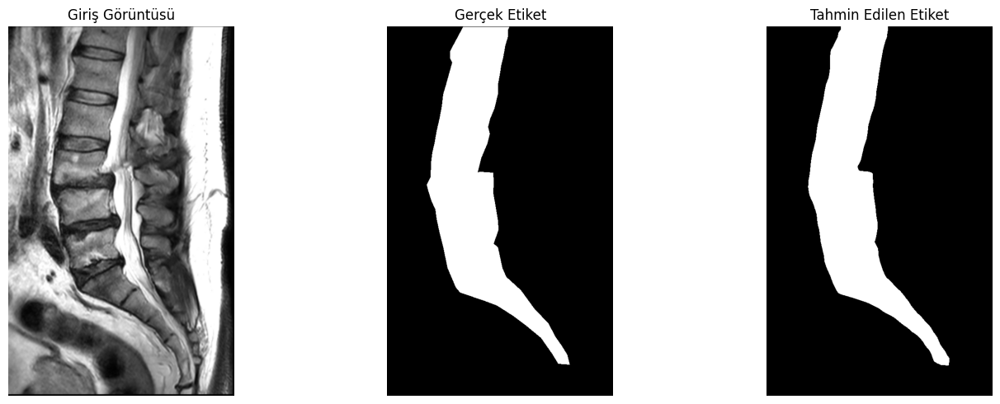

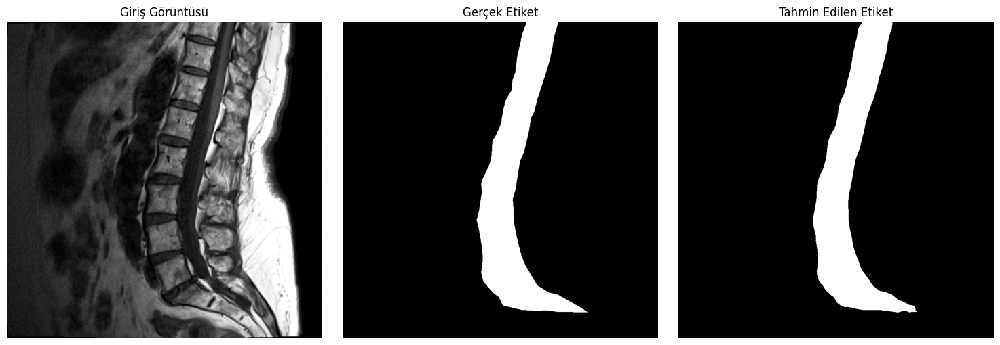

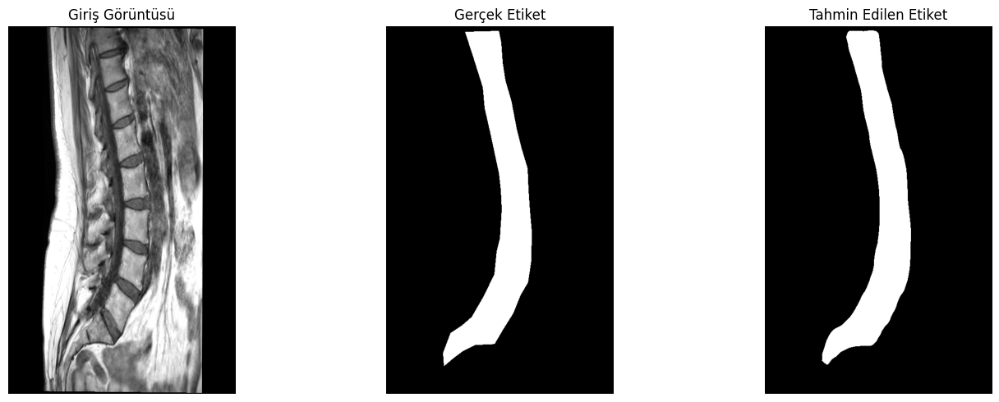

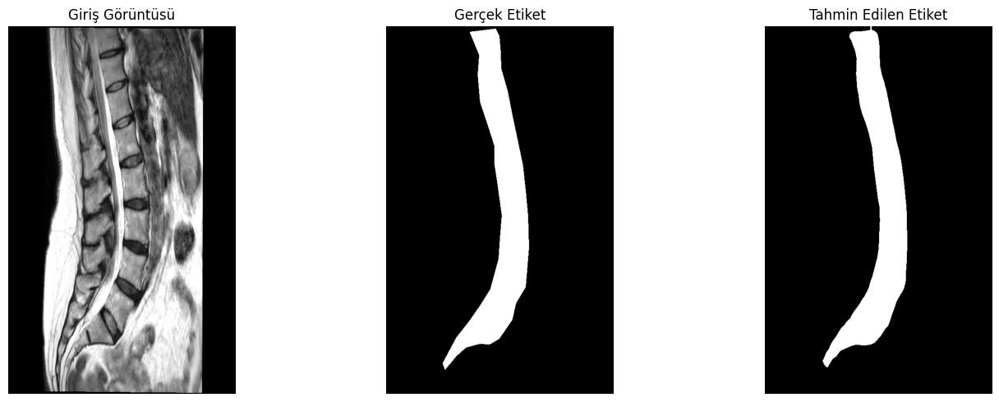

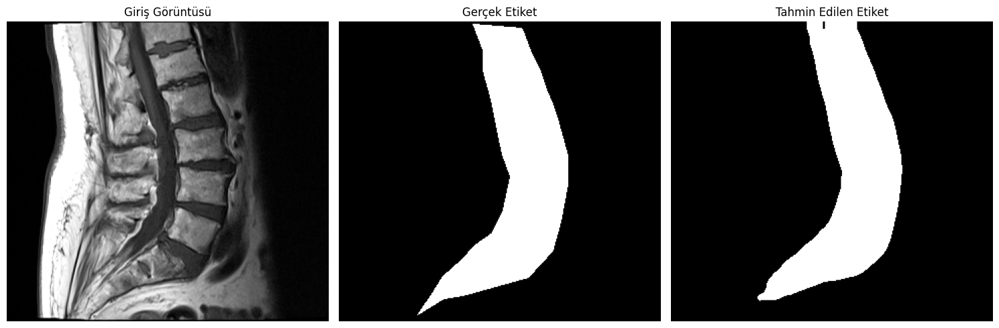

...

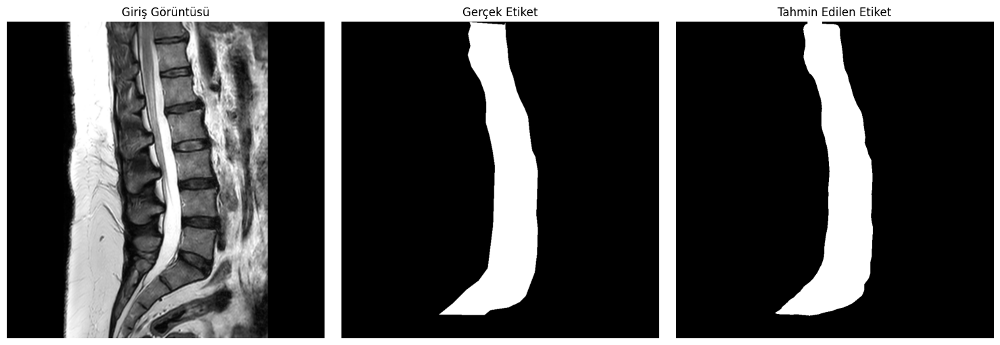

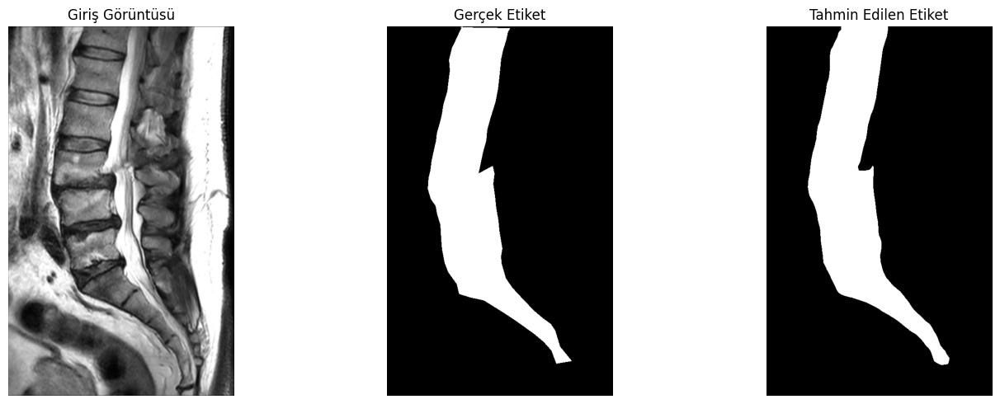

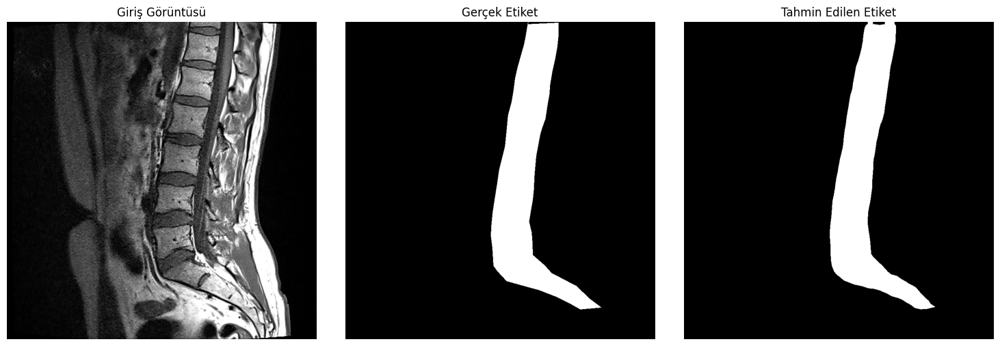

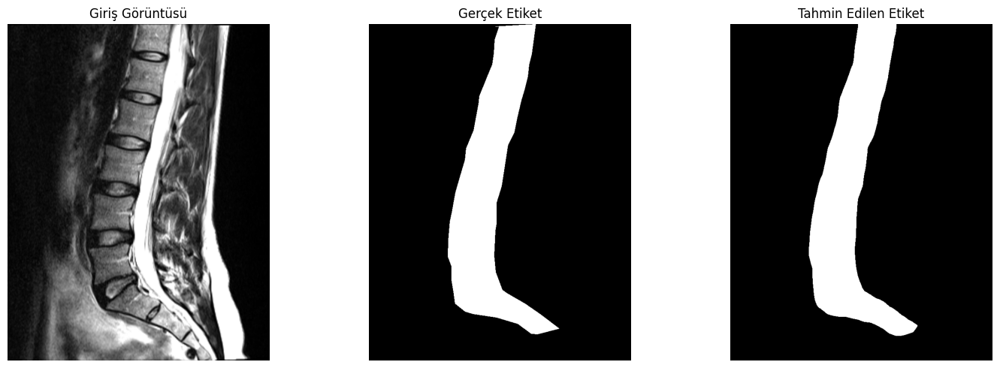

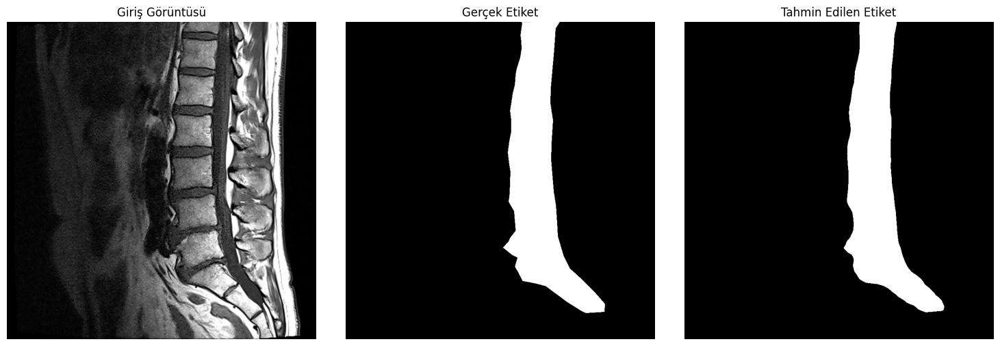

In [9]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader
import torch
from PIL import Image

# Test fonksiyonu
def test_model(model, test_dataset):
    model.eval()  # Modeli eval moduna al
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=collate_fn)

    with torch.no_grad():  # Gradyan hesaplamayı kapat
        for i, (image, label) in enumerate(test_loader):
            # Veriyi cihaza taşı
            image = image.to(device).half()  # FP16 formatına geçiş

            # Modelden çıktı al
            output = model(image)['out']
            output = torch.sigmoid(output).squeeze().cpu().numpy()  # Çıkışı sıkıştır ve CPU'ya taşı

            # Çıkışı ikili maske haline getir
            output_binary = (output > 0.5).astype(float)

            # Gerçek etiketi numpy formatına çevir
            label = label.squeeze().cpu().numpy()

            # Giriş görüntüsünü yeniden boyutlandır (model padding yapabilir)
            input_image = image.cpu().squeeze()
            input_image = TF.to_pil_image(input_image[:3])  # RGB kanalına göre görüntü oluştur

            # Görüntü, gerçek maske ve tahmin edilen maskeyi yan yana göster
            fig, axes = plt.subplots(1, 3, figsize=(15, 5))
            axes[0].imshow(input_image)
            axes[0].set_title("Giriş Görüntüsü")
            axes[0].axis("off")

            axes[1].imshow(label, cmap='gray')
            axes[1].set_title("Gerçek Etiket")
            axes[1].axis("off")

            axes[2].imshow(output_binary, cmap='gray')
            axes[2].set_title("Tahmin Edilen Etiket")
            axes[2].axis("off")

            plt.tight_layout()
            plt.show()

# Test için SpineDataset oluştur
test_dataset = SpineDataset(image_dir, label_dir, transform=preprocess_image)

# Modeli yükle (FP16 formatı)
model.load_state_dict(torch.load("deeplabv3_model_fp16.pth", map_location=device))
model.half()  # Modeli FP16 formatına geçir
print("Model başarıyla yüklendi!")

# Test et ve görüntüle
test_model(model, test_dataset)

# En iyi eşleşen IoU ,En kötü eşleşen IoU

Kodun yaptığı işlemleri adım adım şu şekilde:

1. IoU (Intersection over Union) Hesaplama:

2. Model Değerlendirme:

3. Görselleştirme:

4. Model Yükleme ve Test Etme:

5. Sonuçlar:


Modelin doğruluğunu test etmek için IoU metriğini kullanır ve sonuçları görselleştirir. Modelin en iyi ve en kötü performans gösterdiği örnekler, hem görsel olarak hem de IoU skorları ile birlikte sunulur.

C:\Users\t_g-2\AppData\Local\Temp\ipykernel_15560\2832054626.py:98: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("deeplabv3_model_fp16.pth"

Model başarıyla yüklendi!
En iyi eşleşen IoU: 0.9719
En kötü eşleşen IoU: 0.8964


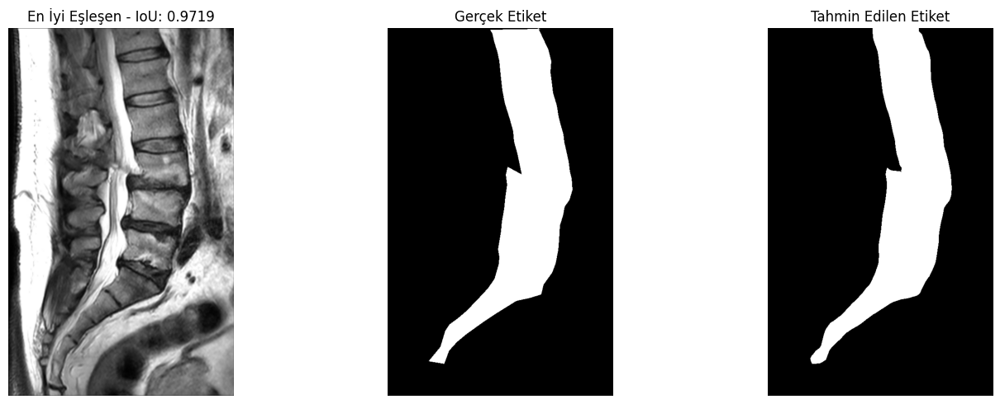

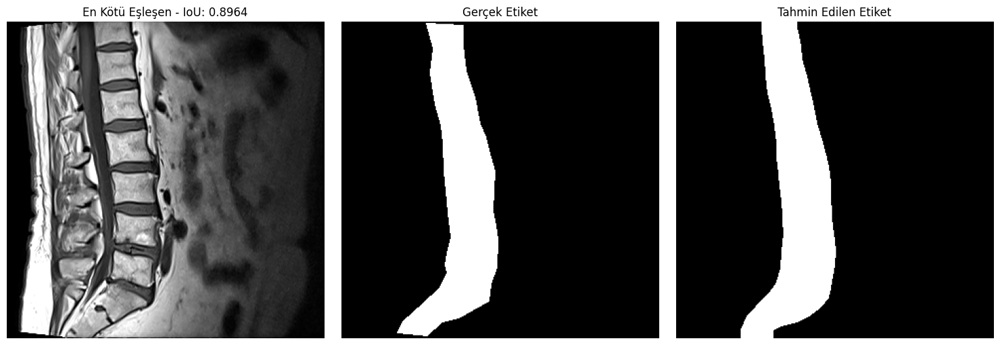

In [10]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader

# IoU hesaplama fonksiyonu
def calculate_iou(pred, target, threshold=0.5):
    # İkili maske haline getir
    pred_binary = (pred > threshold).astype(float)
    target_binary = (target > threshold).astype(float)

    # Kesişim ve birleşim
    intersection = np.sum(pred_binary * target_binary)
    union = np.sum(pred_binary) + np.sum(target_binary) - intersection

    # IoU hesapla
    iou = intersection / (union + 1e-6)  # 1e-6 küçük bir değer ekleyerek bölme hatasını önler
    return iou

# Model değerlendirme fonksiyonu
def evaluate_model(model, test_dataset, num_samples=10):
    model.eval()
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, collate_fn=collate_fn)
    
    iou_scores = []
    best_match = None
    worst_match = None
    best_iou = -1
    worst_iou = float('inf')

    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            if i >= num_samples:
                break
            
            # Cihaza taşı
            image = image.to(device).half()  # FP16 formatı
            label = label.squeeze().cpu().numpy()  # Gerçek etiketi numpy formatına çevir
            
            # Modelden çıktı al
            output = model(image)['out']
            output = torch.sigmoid(output).squeeze().cpu().numpy()

            # IoU hesapla
            iou = calculate_iou(output, label)
            iou_scores.append(iou)

            # En iyi ve en kötü eşleşen görüntüleri bul
            if iou > best_iou:
                best_iou = iou
                best_match = (image.cpu().squeeze(), label, output)
            
            if iou < worst_iou:
                worst_iou = iou
                worst_match = (image.cpu().squeeze(), label, output)

    print(f"En iyi eşleşen IoU: {best_iou:.4f}")
    print(f"En kötü eşleşen IoU: {worst_iou:.4f}")

    # Görüntüleri göster
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(TF.to_pil_image(best_match[0][:3]), cmap='gray')  # RGB formatına çevir
    axes[0].set_title(f"En İyi Eşleşen - IoU: {best_iou:.4f}")
    axes[0].axis("off")

    axes[1].imshow(best_match[1], cmap='gray')
    axes[1].set_title("Gerçek Etiket")
    axes[1].axis("off")

    axes[2].imshow(best_match[2] > 0.5, cmap='gray')
    axes[2].set_title("Tahmin Edilen Etiket")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(TF.to_pil_image(worst_match[0][:3]), cmap='gray')  # RGB formatına çevir
    axes[0].set_title(f"En Kötü Eşleşen - IoU: {worst_iou:.4f}")
    axes[0].axis("off")

    axes[1].imshow(worst_match[1], cmap='gray')
    axes[1].set_title("Gerçek Etiket")
    axes[1].axis("off")

    axes[2].imshow(worst_match[2] > 0.5, cmap='gray')
    axes[2].set_title("Tahmin Edilen Etiket")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

# Test için SpineDataset oluştur
test_dataset = SpineDataset(image_dir, label_dir, transform=preprocess_image)

# Modeli yükle
model.load_state_dict(torch.load("deeplabv3_model_fp16.pth", map_location=device))
model = model.to(device).half()  # FP16 formatına geçiş
print("Model başarıyla yüklendi!")

# Test et ve en iyi/kötü eşleşen görüntüleri göster
evaluate_model(model, test_dataset, num_samples=10)
